# F1 Simple EDA baz

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

sns.set_theme(style='whitegrid', context='notebook')
plt.rcParams['figure.figsize'] = (12, 5)

In [52]:
DATA_DIR = 'data_cleaned'
print(f'Using data directory: {DATA_DIR}')

Using data directory: data_cleaned


In [53]:

def read_first_existing(names):
    for name in names:
        p = f"{DATA_DIR}/{name}"
        try:
            return pd.read_csv(p)
        except Exception:
            # Try next name
            continue
    return None

lap_times  = read_first_existing(['lap_times_cleaned.csv'])
drivers    = read_first_existing(['drivers_cleaned.csv'])
pit_stops  = read_first_existing(['pit_stops_cleaned.csv'])
constructors = read_first_existing(['constructors_cleaned.csv', 'constructors.csv', 'constructor_standings_cleaned.csv'])  # optional

for name, df in [('lap_times', lap_times), ('drivers', drivers), ('pit_stops', pit_stops), ('constructors', constructors)]:
    if df is not None:
        print(f'{name}: shape={df.shape}')
    else:
        print(f'{name}: not found (skipped)')

lap_times: shape=(589081, 5)
drivers: shape=(40, 6)
pit_stops: shape=(11371, 12)
constructors: shape=(13391, 6)


## Overview of cleaned files by cleaning team jazimanasmehreen

In [34]:
def preview(df, name, n=5):
    if df is not None:
        print(f"\n{name} — shape={df.shape}")
        display(df.head(n))
        print('Columns:', list(df.columns))

preview(lap_times, 'lap_times')
preview(drivers, 'drivers')
preview(pit_stops, 'pit_stops')
preview(constructors, 'constructors')


lap_times — shape=(589081, 5)


,raceId,driverId,lap,position,time
0,841,20,1,1,98.109
1,841,20,2,1,93.006
2,841,20,3,1,92.713
3,841,20,4,1,92.803
4,841,20,5,1,92.342


Columns: ['raceId', 'driverId', 'lap', 'position', 'time']

drivers — shape=(40, 6)


,driverId,number,code,forename,surname,nationality
0,1,44,HAM,Lewis,Hamilton,British
1,4,14,ALO,Fernando,Alonso,Spanish
2,8,7,RAI,Kimi,Räikkönen,Finnish
3,9,88,KUB,Robert,Kubica,Polish
4,20,5,VET,Sebastian,Vettel,German


Columns: ['driverId', 'number', 'code', 'forename', 'surname', 'nationality']

pit_stops — shape=(11371, 12)


,raceId,driverId,stop,lap,time,duration,time_hours,time_mins,time_secs,duration_seconds,duration_minutes,duration_seconds_remainder
0,841,153,1,1,17:05:23,26.898,17,5,23,26.898,0.0,26.898
1,841,30,1,1,17:05:52,25.021,17,5,52,25.021,0.0,25.021
2,841,17,1,11,17:20:48,23.426,17,20,48,23.426,0.0,23.426
3,841,4,1,12,17:22:34,23.251,17,22,34,23.251,0.0,23.251
4,841,13,1,13,17:24:10,23.842,17,24,10,23.842,0.0,23.842


Columns: ['raceId', 'driverId', 'stop', 'lap', 'time', 'duration', 'time_hours', 'time_mins', 'time_secs', 'duration_seconds', 'duration_minutes', 'duration_seconds_remainder']

constructors — shape=(13391, 6)


,constructorStandingsId,raceId,constructorId,points,position,wins
0,1,18,1,14.0,1,1
1,2,18,2,8.0,3,0
2,3,18,3,9.0,2,0
3,4,18,4,5.0,4,0
4,5,18,5,2.0,5,0


Columns: ['constructorStandingsId', 'raceId', 'constructorId', 'points', 'position', 'wins']


## Lap times: distribution and insights

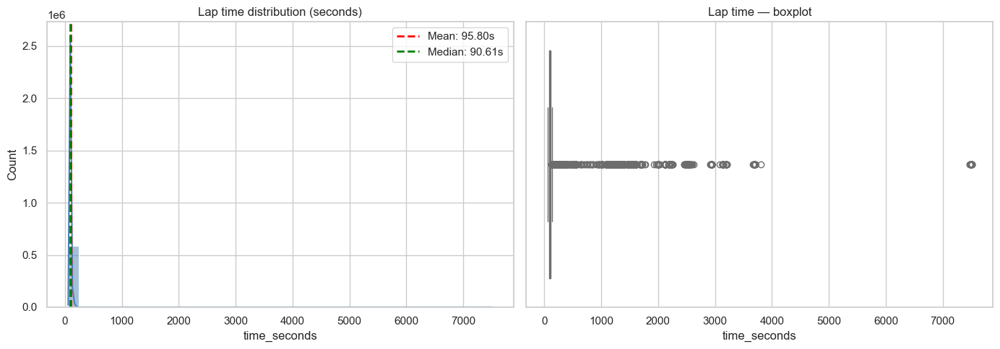

Lap time summary (seconds):
count    589081.000000
mean         95.799445
std          76.399730
min          55.404000
25%          82.041000
50%          90.608000
75%         101.930000
90%         113.028000
95%         121.719000
max        7507.547000
Name: time_seconds, dtype: float64
Std: 76.400 | IQR: 19.889 | CoefVar: 79.75%
Skewness: 53.162


In [55]:
if lap_times is not None and len(lap_times) > 0:
    lt = lap_times.copy()
    if 'milliseconds' in lt.columns:
        lt['time_seconds'] = lt['milliseconds'] / 1000.0
    elif 'time' in lt.columns:
        lt['time_seconds'] = pd.to_numeric(lt['time'], errors='coerce')
    elif 'seconds' in lt.columns:
        lt['time_seconds'] = pd.to_numeric(lt['seconds'], errors='coerce')
    else:
        num_cols = lt.select_dtypes(include=[np.number]).columns
        lt['time_seconds'] = lt[num_cols[0]] if len(num_cols) else np.nan

    ts = lt['time_seconds'].dropna()
    if len(ts) > 0:
        fig, axes = plt.subplots(1, 2, figsize=(14, 5))
        sns.histplot(ts, bins=40, kde=True, color='steelblue', ax=axes[0])
        axes[0].axvline(ts.mean(), color='red', ls='--', lw=2, label=f'Mean: {ts.mean():.2f}s')
        axes[0].axvline(ts.median(), color='green', ls='--', lw=2, label=f'Median: {ts.median():.2f}s')
        axes[0].set_title('Lap time distribution (seconds)')
        axes[0].legend()
        sns.boxplot(x=ts, color='salmon', ax=axes[1])
        axes[1].set_title('Lap time — boxplot')
        plt.tight_layout(); plt.show()

        desc = ts.describe(percentiles=[0.25, 0.5, 0.75, 0.9, 0.95])
        skew = ts.skew(); 
        std = ts.std(); mean = ts.mean(); median = ts.median()
        iqr = ts.quantile(0.75) - ts.quantile(0.25)
        cv = (std / mean) * 100 if mean != 0 else np.nan

        print('Lap time summary (seconds):')
        print(desc)
        print(f"Std: {std:.3f} | IQR: {iqr:.3f} | CoefVar: {cv:.2f}%")
        print(f'Skewness: {skew:.3f}')

### Insights:
- Mean > Median: Right-skewed tendency (slow-lap outliers pulling the mean up).
- Positive skew: Most laps near typical pace with a tail of slower laps (traffic/incidents).
- Spread: IQR shows typical lap-to-lap variability; higher CoefVar means more relative dispersion

## Pit stops

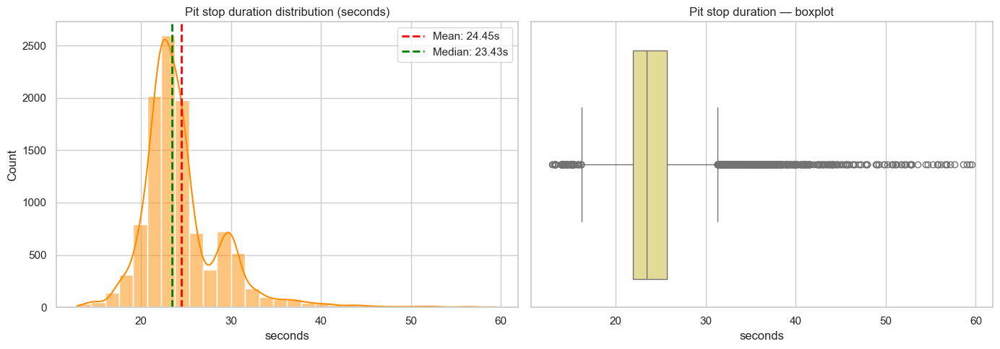

Pit stop duration summary (seconds):
count    10854.000000
mean        24.448585
std          4.606013
min         12.897000
25%         21.864000
50%         23.428500
75%         25.639750
90%         30.111700
95%         32.281150
max         59.555000
Name: seconds, dtype: float64
Std: 4.606 | IQR: 3.776 | CoefVar: 18.84%
Skewness: 2.001  


In [57]:
if pit_stops is not None and len(pit_stops) > 0:
    ps = pit_stops.copy()
    if 'milliseconds' in ps.columns:
        ps['seconds'] = ps['milliseconds'] / 1000.0
    elif 'duration' in ps.columns:
        ps['seconds'] = pd.to_numeric(ps['duration'], errors='coerce')
    else:
        num_cols = ps.select_dtypes(include=[np.number]).columns
        ps['seconds'] = ps[num_cols[0]] if len(num_cols) else np.nan

    secs = ps['seconds'].dropna()
    if len(secs) > 0:
        fig, axes = plt.subplots(1, 2, figsize=(14, 5))
        sns.histplot(secs, bins=30, kde=True, color='darkorange', ax=axes[0])
        axes[0].axvline(secs.mean(), color='red', ls='--', lw=2, label=f'Mean: {secs.mean():.2f}s')
        axes[0].axvline(secs.median(), color='green', ls='--', lw=2, label=f'Median: {secs.median():.2f}s')
        axes[0].set_title('Pit stop duration distribution (seconds)')
        axes[0].legend()
        sns.boxplot(x=secs, color='khaki', ax=axes[1])
        axes[1].set_title('Pit stop duration — boxplot')
        plt.tight_layout(); plt.show()

        desc = secs.describe(percentiles=[0.25, 0.5, 0.75, 0.9, 0.95])
        skew = secs.skew(); kurt = secs.kurtosis()
        std = secs.std(); mean = secs.mean(); median = secs.median()
        iqr = secs.quantile(0.75) - secs.quantile(0.25)
        cv = (std / mean) * 100 if mean != 0 else np.nan

        print('Pit stop duration summary (seconds):')
        print(desc)
        print(f"Std: {std:.3f} | IQR: {iqr:.3f} | CoefVar: {cv:.2f}%")
        print(f'Skewness: {skew:.3f}  ')


### Insights:
- Mean > Median: Right-skewed: There were a few slow stops, which raised the average.
- Positive skew: Most stops are efficient with a tail of slow events.
- Heavier tails: Occasional extreme slow/fast stops, causing heavier outliers
- Spread: IQR captures typical variation; higher CoefVar indicates more relative inconsistency.

## Drivers

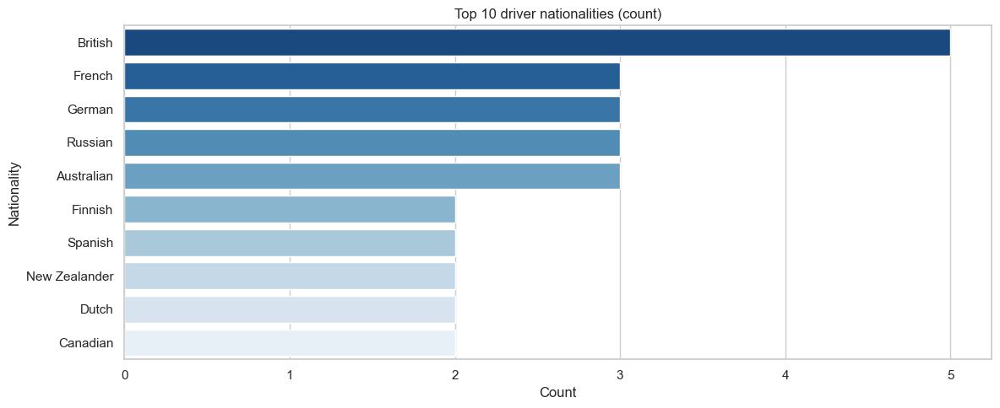

Driver nationality (top 10) — counts and % of all drivers:


,count,%
nationality,,
British,5,12.5
French,3,7.5
German,3,7.5
Russian,3,7.5
Australian,3,7.5
Finnish,2,5.0
Spanish,2,5.0
New Zealander,2,5.0
Dutch,2,5.0


In [38]:
if drivers is not None and 'nationality' in drivers.columns:
    top_nat = drivers['nationality'].value_counts().head(10)
    sns.barplot(x=top_nat.values, y=top_nat.index, palette='Blues_r')
    plt.title('Top 10 driver nationalities (count)')
    plt.xlabel('Count'); plt.ylabel('Nationality')
    plt.tight_layout(); plt.show()

    total = drivers['nationality'].shape[0]
    pct = (top_nat / total * 100).round(2)
    print('Driver nationality (top 10) — counts and % of all drivers:')
    display(pd.DataFrame({'count': top_nat, '%': pct}))
elif drivers is not None:
    print('Drivers file available but no "nationality" column found.')
else:
    print('Drivers file not available.')

### Majority of the drivers appear to be from Europe, with most of them being from the United Kingdom. 

## Simple correlation heatmaps (numeric) 

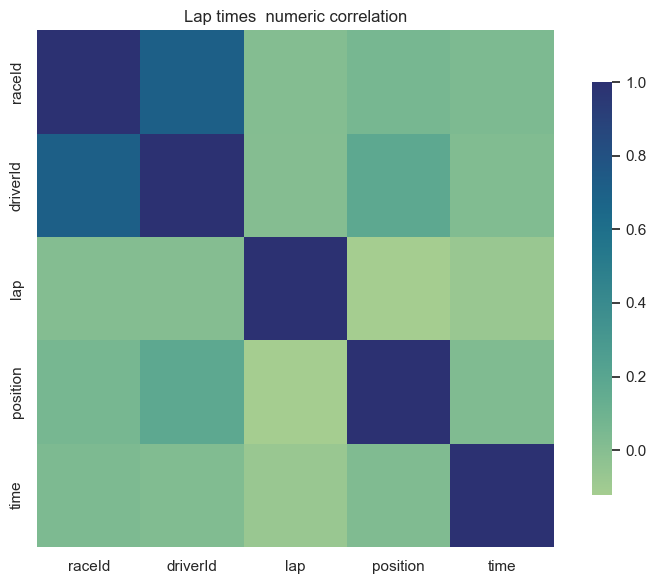

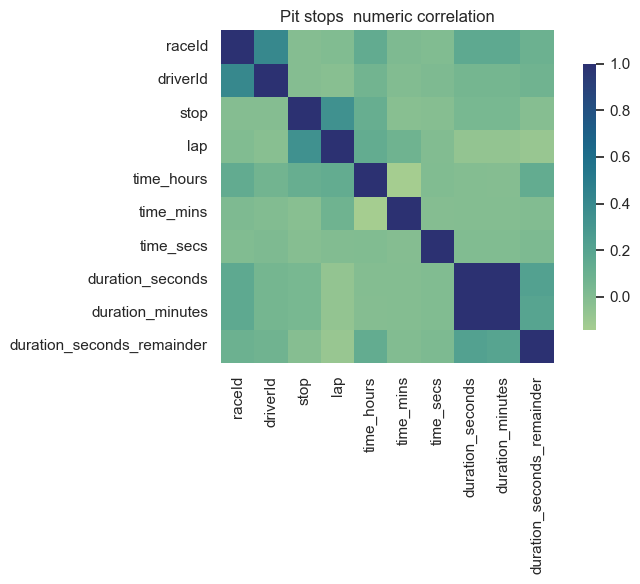

In [59]:
def corr_heatmap(df, title):
    num = df.select_dtypes(include=[np.number]) if df is not None else pd.DataFrame()
    if num.shape[1] >= 2:
        corr = num.corr(numeric_only=True)
        plt.figure(figsize=(8, 6))
        sns.heatmap(corr, annot=False, cmap='crest', square=True, cbar_kws={'shrink': .8})
        plt.title(title); plt.tight_layout(); plt.show()
    else:
        print(f'{title}: not enough numeric columns for correlation heatmap.')

corr_heatmap(lap_times, 'Lap times  numeric correlation')
corr_heatmap(pit_stops, 'Pit stops  numeric correlation')

## Interactive (Plotly) quick views
- Lap times: interactive histogram with marginal box and a range slider.
- Pit stops: interactive violin (shows distribution and outliers).
- Drivers: optional interactive bar for top nationalities.

In [62]:
if lap_times is not None and len(lap_times) > 0:
    lt = lap_times.copy()
    if 'milliseconds' in lt.columns:
        lt['time_seconds'] = lt['milliseconds'] / 1000.0
    elif 'time' in lt.columns:
        lt['time_seconds'] = pd.to_numeric(lt['time'], errors='coerce')
    elif 'seconds' in lt.columns:
        lt['time_seconds'] = pd.to_numeric(lt['seconds'], errors='coerce')
    else:
        num_cols = lt.select_dtypes(include=[np.number]).columns
        lt['time_seconds'] = lt[num_cols[0]] if len(num_cols) else np.nan

    ts = lt['time_seconds'].dropna()
    if len(ts) > 0:
        df_ts = pd.DataFrame({'time_seconds': ts})
        fig = px.histogram(
            df_ts, x='time_seconds', nbins=60,
            marginal='box', template='plotly_white',
            title='Lap time distribution (seconds) — interactive'
        )
        fig.update_xaxes(rangeslider=dict(visible=True))
        fig.update_layout(bargap=0.05)
        fig.show()
    else:
        print('Lap times present, but no usable numeric time column found for Plotly histogram.')
else:
    print('Lap times file not available.')

In [61]:
# Pit stops — interactive violin
if pit_stops is not None and len(pit_stops) > 0:
    ps = pit_stops.copy()
    if 'milliseconds' in ps.columns:
        ps['seconds'] = ps['milliseconds'] / 1000.0
    elif 'duration' in ps.columns:
        ps['seconds'] = pd.to_numeric(ps['duration'], errors='coerce')
    else:
        num_cols = ps.select_dtypes(include=[np.number]).columns
        ps['seconds'] = ps[num_cols[0]] if len(num_cols) else np.nan

    secs = ps['seconds'].dropna()
    if len(secs) > 0:
        df_secs = pd.DataFrame({'seconds': secs})
        fig = px.violin(
            df_secs, y='seconds', box=True, points='outliers',
            template='plotly_white', title='Pit stop duration — interactive violin'
        )
        fig.update_yaxes(title='Seconds')
        fig.show()
    else:
        print('Pit stops present, but no usable numeric duration column found for Plotly violin.')
else:
    print('Pit stops file not available.')

In [46]:
# Drivers — interactive bar (top 10 nationalities)
if drivers is not None and 'nationality' in drivers.columns:
    top_nat = drivers['nationality'].value_counts().head(10)
    df_nat = top_nat.reset_index()
    df_nat.columns = ['nationality', 'count']
    fig = px.bar(
        df_nat, x='count', y='nationality', orientation='h',
        text='count', template='plotly_white',
        title='Top 10 driver nationalities — interactive bar'
    )
    fig.update_traces(textposition='outside')
    fig.update_layout(yaxis={'categoryorder':'total ascending'})
    fig.show()
elif drivers is not None:
    print('Drivers file available but no "nationality" column found for Plotly bar.')
else:
    print('Drivers file not available.')